In [1]:
import requests
import pandas as pd
import plotly.express as px
import plotly.graph_objs as go
import os
import numpy as np

# Restaurant Scores Feature Engineering
https://data.sfgov.org/Health-and-Social-Services/Restaurant-Scores-LIVES-Standard/pyih-qa8i?row_index=0

This dataset describes health inspection results for restaurants in San Fransisco

## Getting Data

In [ ]:
# Reading
df = pd.read_csv('https://data.sfgov.org/api/views/pyih-qa8i/rows.csv?accessType=DOWNLOAD')

In [ ]:
# Rewriting to parquet
df.to_parquet('./data/restaurant_scores.parquet')

# Rereading from Disk
In case there is no internet access

In [ ]:
df = pd.read_parquet('./data/restaurant_scores.parquet')
df

# Top Level Info

In [ ]:
display(df.info())
print('\nColumn Null Percent\n')
display(df.isnull().sum() / len(df))

In [ ]:
missing_addresses = df[pd.isnull(df['business_latitude'])].drop_duplicates(subset=['business_address'])[['business_name', 'business_address', 'business_city', 'business_state', 'business_postal_code']]
missing_addresses_list = missing_addresses.to_dict('records')
display(missing_addresses)

In [ ]:
missing_addresses_list[0]

# Geocoding

## Free

In [ ]:
# So many missing lat/lngs let's geocode
# Free first
results = []
for row in missing_addresses_list:
    address_request = f"{row.get('business_address')}, {row.get('business_city')}, {row.get('business_state')}"
    response = requests.get(f'https://geocode.maps.co/search?q={address_request}').json()
    if len(response) > 0:
        results.append({
            'business_name': row.get('business_name'), 
            'business_address': row.get('business_address'),
            'raw_response': response
                       })

In [ ]:
# Cleaning free results
free_results_df = pd.DataFrame(results)
first_place_result = free_results_df['raw_response'].apply(pd.Series)[0].apply(pd.Series)[['lat', 'lon', 'display_name', 'class', 'type']]
free_results_df = pd.merge(free_results_df, first_place_result, left_index=True, right_index=True)
free_results_df

## Geocodio
You'll need to sign up for a free api key at https://dash.geocod.io/register. 

Then place it into the geocodio_key.txt

In [ ]:
# Now a nicer geocode service for the remainder
still_missing_addresses = missing_addresses[~missing_addresses['business_address'].isin(free_results_df['business_address'])].copy()
still_missing_addresses['full_address'] = (still_missing_addresses['business_address'] 
                                           + ', ' + still_missing_addresses['business_city'] 
                                           + ', ' + still_missing_addresses['business_state'] 
                                           + np.where(pd.isnull(still_missing_addresses['business_postal_code']), '', ', ') + still_missing_addresses['business_postal_code'].fillna('')
                                          )
still_missing_addresses_list = still_missing_addresses['full_address'].to_list()

In [ ]:
with open('geocodio_key.txt', 'r') as f:
    api_key = f.read()

response = requests.post('https://api.geocod.io/v1.7/geocode', 
                         headers={'Content-Type': 'application/json'}, params={'api_key': api_key},
                         json=still_missing_addresses_list)

In [ ]:
# Cleaning premium results
premium_results_df = pd.DataFrame(response.json().get('results'))
location_df = premium_results_df['response'].apply(pd.Series)['results'].apply(pd.Series)[0].apply(pd.Series)['location'].apply(pd.Series)
premium_results_df = pd.merge(premium_results_df, location_df, left_index=True, right_index=True)
premium_results_df['business_address'] = premium_results_df['query'].str.split(',').str[0]
premium_results_df

In [ ]:
# Concatenating results
geo_results_df = pd.concat([free_results_df[['business_address', 'lat', 'lon']].rename(columns={'lon': 'lng'}),
                          premium_results_df[['business_address', 'lat', 'lng']]]).drop_duplicates(subset=['business_address'])
geo_results_df

In [ ]:
# Merging results
enriched_df = pd.merge(df, geo_results_df, on='business_address', how='left')
enriched_df['business_latitude'] = enriched_df['business_latitude'].combine_first(enriched_df['lat'])
enriched_df['business_longitude'] = enriched_df['business_longitude'].combine_first(enriched_df['lng'])
enriched_df['business_latitude'] = enriched_df['business_latitude'].astype(float)
enriched_df['business_longitude'] = enriched_df['business_longitude'].astype(float)
enriched_df

In [ ]:
# Saving back out
enriched_df.drop(columns=['lat', 'lng']).to_parquet('./data/enriched_data.parquet')

In [ ]:
enriched_df['business_name'].value_counts()

# Rereading from Disk again

In [2]:
pd.options.display.max_columns = 50
enriched_df = pd.read_parquet('./data/enriched_data.parquet')
enriched_df

,business_id,business_name,business_address,business_city,business_state,business_postal_code,business_latitude,business_longitude,business_location,business_phone_number,inspection_id,inspection_date,inspection_score,inspection_type,violation_id,violation_description,risk_category,Neighborhoods,SF Find Neighborhoods,Current Police Districts,Current Supervisor Districts,Analysis Neighborhoods
0,835,Kam Po Kitchen,801 Broadway St,San Francisco,CA,94133,37.797223,-122.410513,POINT (-122.410513 37.797223),NaN,835_20180917,09/17/2018 12:00:00 AM,88.0,Routine - Unscheduled,835_20180917_103139,Improper food storage,Low Risk,107.0,107.0,6.0,3.0,6.0
1,905,Working Girls' Cafe',0259 Kearny St,San Francisco,CA,94108,37.790477,-122.404033,POINT (-122.404033 37.790477),NaN,905_20190415,04/15/2019 12:00:00 AM,87.0,Routine - Unscheduled,905_20190415_103114,High risk vermin infestation,High Risk,19.0,19.0,6.0,3.0,8.0
2,1203,TAWAN'S THAI FOOD,4403 GEARY Blvd,San Francisco,CA,94118,37.780834,-122.466590,POINT (-122.46659 37.780834),1.415576e+10,1203_20170803,08/03/2017 12:00:00 AM,77.0,Routine - Unscheduled,1203_20170803_103120,Moderate risk food holding temperature,Moderate Risk,5.0,5.0,8.0,4.0,11.0
3,1345,Cordon Bleu,1574 California St,San Francisco,CA,94109,37.790683,-122.420264,POINT (-122.420264 37.790683),NaN,1345_20170928,09/28/2017 12:00:00 AM,81.0,Routine - Unscheduled,1345_20170928_103105,Improper cooling methods,High Risk,105.0,105.0,4.0,3.0,21.0
4,1352,LA TORTILLA,495 Castro St B,San Francisco,CA,94114,37.760954,-122.434935,POINT (-122.434935 37.760954),1.415586e+10,1352_20180620,06/20/2018 12:00:00 AM,74.0,Routine - Unscheduled,1352_20180620_103177,Non service animal,Low Risk,38.0,38.0,3.0,5.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53968,96202,Soma Eats 2,121 Spear St,San Francisco,CA,94105,37.791865,-122.392910,None,NaN,96202_20190408,04/08/2019 12:00:00 AM,85.0,Routine - Unscheduled,96202_20190408_103124,Inadequately cleaned or sanitized food contact...,Moderate Risk,NaN,NaN,NaN,NaN,NaN
53969,65396,Carmelina's Cafe,1855 Folsom St,San Francisco,CA,94103,37.767664,-122.415456,POINT (-122.415456 37.767664),NaN,65396_20170127,01/27/2017 12:00:00 AM,NaN,Reinspection/Followup,None,None,None,53.0,53.0,3.0,2.0,20.0
53970,64835,Jane,2123 Fillmore St,San Francisco,CA,94115,37.789404,-122.433954,POINT (-122.433954 37.789404),NaN,64835_20161205,12/05/2016 12:00:00 AM,NaN,Reinspection/Followup,None,None,None,102.0,102.0,4.0,6.0,30.0
53971,1000,HEUNG YUEN RESTAURANT,3279 22nd St,San Francisco,CA,94110,37.755282,-122.420493,POINT (-122.420493 37.755282),NaN,1000_20180608,06/08/2018 12:00:00 AM,NaN,Reinspection/Followup,None,None,None,53.0,53.0,3.0,2.0,20.0


# Analysis

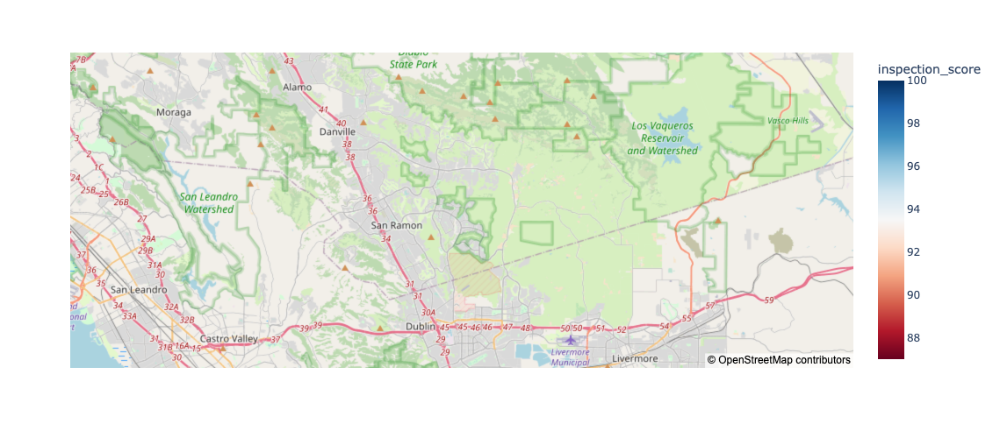

In [3]:
plot_df = enriched_df[
    (pd.notnull(enriched_df['inspection_score']))
    & (enriched_df['business_city'] == 'San Francisco')]
fig = px.scatter_mapbox(plot_df, lat='business_latitude', lon='business_longitude', 
                        height=500, zoom=10, color='inspection_score', color_continuous_scale='rdbu', hover_data=['business_name', 'violation_description'],
                       range_color=[plot_df['inspection_score'].median(), plot_df['inspection_score'].max()])
fig.update_layout(mapbox_style='open-street-map')
fig.show()